### Importamos los paquetes necesarios

In [35]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt

from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate

from sklearn.tree import DecisionTreeClassifier

from sklearn import tree

from IPython.display import Image  

from skopt import gp_minimize
from skopt.space import Categorical, Dimension, Integer, Real  # noqa

import warnings
warnings.filterwarnings('ignore')

In [36]:
random_state = 7777

### Una funcion de regalo para hacer prunning del arbol

In [37]:
from sklearn.tree._tree import TREE_LEAF

def prune_tree(inner_tree, umbral=0.5, index=0):
    if(inner_tree.children_left[index] == TREE_LEAF):
        cant_clase_1 = inner_tree.value[index][0][0]
        cant_clase_2 = inner_tree.value[index][0][1]
        total = cant_clase_1+cant_clase_2
        p_clase_2 = cant_clase_2/total
        if(p_clase_2 > umbral):
            return 1
        else:
            return 0
    else:
        left_class = prune_tree(inner_tree, umbral=umbral, index=inner_tree.children_left[index])
        right_class = prune_tree(inner_tree, umbral=umbral, index=inner_tree.children_right[index])
        if((left_class>=0)&(right_class>=0) & (left_class == right_class)):
            inner_tree.children_left[index] = TREE_LEAF
            inner_tree.children_right[index] = TREE_LEAF
            return left_class
        else:
            return -1
    
#prune_tree(clf.tree_, 0.111111112)

## Zona de Feature engineering y filtrado

In [38]:
def feature_engineering_codificacion_categorica_alcohol(df):
    df_output = df.copy()
    
    conditions = [
        (df_output['beer_abv'] < 3),
        (df_output['beer_abv'] >= 3) & (df_output['beer_abv'] < 6),
        (df_output['beer_abv'] >= 6) & (df_output['beer_abv'] < 9),
        (df_output['beer_abv'] >= 9) & (df_output['beer_abv'] < 12),
        (df_output['beer_abv'] >= 12)
    ]

    values = ["MUY BAJA", "BAJA", "MEDIA", "FUERTE", "MUY FUERTE"]

    df_output['potencia_alcoholica'] = np.select(conditions, values)
    return df_output

def feature_engineering_one_hot_encoding_potencia_alcohol(df):
    df_output = df.copy()
    
    df_output['potencia_alcoholica_muy_baja'] = 0
    df_output.loc[df_output['potencia_alcoholica']=='MUY BAJA','potencia_alcoholica_muy_baja'] = 1

    df_output['potencia_alcoholica_baja'] = 0
    df_output.loc[df_output['potencia_alcoholica']=='BAJA','potencia_alcoholica_baja'] = 1
    
    df_output['potencia_alcoholica_media'] = 0
    df_output.loc[df_output['potencia_alcoholica']=='MEDIA','potencia_alcoholica_media'] = 1
    
    df_output['potencia_alcoholica_fuerte'] = 0
    df_output.loc[df_output['potencia_alcoholica']=='FUERTE','potencia_alcoholica_fuerte'] = 1
    
    df_output['potencia_alcoholica_muy_fuerte'] = 0
    df_output.loc[df_output['potencia_alcoholica_muy_fuerte']=='MUY FUERTE','potencia_alcoholica_muy_fuerte'] = 1
    
    return df_output

def feature_engineering_promedio_y_total(df):
    df_output = df.copy()
    
    df_output['review_promedio'] = (df['review_overall'] + df['review_aroma'] + df['review_appearance'] + df['review_palate'] + df['review_taste'])/5
    df_output['review_total'] = (df['review_overall'] + df['review_aroma'] + df['review_appearance'] + df['review_palate'] + df['review_taste'])
    
    return df_output

def feature_engineering_relacion_al_overall(df):
    df_output = df.copy()
    
    df_output['relacion_overall_aroma'] = df_output['review_aroma']/df['review_overall']
    df_output['relacion_overall_appearance'] = df_output['review_appearance']/df['review_overall']
    df_output['relacion_overall_palate'] = df_output['review_palate']/df['review_overall']
    df_output['relacion_overall_taste'] = df_output['review_taste']/df['review_overall']
    
    return df_output

def filtering_1(df):
    df_output = df
    return df_output

### Carga de datos

In [39]:
directorio_data = '../data/'

x_training_file = directorio_data + 'x_traininig.csv'
y_training_file = directorio_data + 'y_traininig.csv'

x_testing_file = directorio_data + 'x_testing.csv'
y_testing_file = directorio_data + 'y_testing.csv'

In [40]:
df_x_training_validacion = pd.read_csv(x_training_file)
df_y_training_validacion = pd.read_csv(y_training_file)

df_x_testing = pd.read_csv(x_testing_file)
df_y_testing = pd.read_csv(y_testing_file)

### Aplicamos las funciones de feature engineering a los datasets de training y testing

In [51]:
funciones = [
    "feature_engineering_codificacion_categorica_alcohol",
    "feature_engineering_one_hot_encoding_potencia_alcohol",
    "feature_engineering_promedio_y_total",
    "feature_engineering_relacion_al_overall"
]

df_x_training_validacion_fe = df_x_training_validacion.copy()
df_x_testing_fe = df_x_testing.copy()

for funcion in funciones:
    #¿es una función de feature engineering?
    if(funcion.startswith('feature_engineering_')):
       long_inicial_x_training_fe = len(df_x_training_validacion_fe)
       df_x_training_validacion_fe = locals()[funcion](df_x_training_validacion_fe)
       long_final_x_training_fe = len(df_x_training_validacion_fe)
       if(long_inicial_x_training_fe != long_final_x_training_fe):
           raise Exception("Se están eliminando registros del dataset de training en una funcion de feature engineering")
       
       
       long_inicial_x_testing_fe = len(df_x_testing_fe)
       df_x_testing_fe = locals()[funcion](df_x_testing_fe)
       long_final_x_testing_fe = len(df_x_testing_fe)
       if(long_inicial_x_testing_fe != long_final_x_testing_fe):
           raise Exception("Se están eliminando registros del dataset de testing en una funcion de feature engineering")
        
    #¿es una función de filtrado?
    elif(funcion.startswith('filtering_')):
       df_x_training_validacion_fe = locals()[funcion](df_x_training_validacion_fe)
           

In [52]:
df_x_training_validacion_fe.head()

,beer_beerid,review_overall,review_aroma,review_appearance,review_palate,review_taste,beer_abv,potencia_alcoholica,potencia_alcoholica_muy_baja,potencia_alcoholica_baja,potencia_alcoholica_media,potencia_alcoholica_fuerte,potencia_alcoholica_muy_fuerte,review_promedio,review_total,relacion_overall_aroma,relacion_overall_appearance,relacion_overall_palate,relacion_overall_taste
0,7377,3.250000,3.000,3.000000,3.250000,3.250000,5.2,BAJA,0,1,0,0,0,3.150000,15.750000,0.923077,0.923077,1.000000,1.000000
1,21753,4.150000,4.175,4.400000,4.125000,4.125000,4.2,BAJA,0,1,0,0,0,4.195000,20.975000,1.006024,1.060241,0.993976,0.993976
2,5330,4.000000,4.000,4.000000,4.000000,4.500000,8.0,MEDIA,0,0,1,0,0,4.100000,20.500000,1.000000,1.000000,1.000000,1.125000
3,67188,4.125000,3.875,3.750000,4.125000,4.000000,6.0,MEDIA,0,0,1,0,0,3.975000,19.875000,0.939394,0.909091,1.000000,0.969697
4,16542,4.208333,3.750,4.333333,4.083333,4.083333,6.7,MEDIA,0,0,1,0,0,4.091667,20.458333,0.891089,1.029703,0.970297,0.970297


In [53]:
df_x_testing_fe.head()

,beer_beerid,review_overall,review_aroma,review_appearance,review_palate,review_taste,beer_abv,potencia_alcoholica,potencia_alcoholica_muy_baja,potencia_alcoholica_baja,potencia_alcoholica_media,potencia_alcoholica_fuerte,potencia_alcoholica_muy_fuerte,review_promedio,review_total,relacion_overall_aroma,relacion_overall_appearance,relacion_overall_palate,relacion_overall_taste
0,10364,3.751534,3.030675,3.257669,3.266871,3.401840,4.6,BAJA,0,1,0,0,0,3.341718,16.708589,0.807850,0.868357,0.870809,0.906787
1,18518,3.818182,3.727273,3.545455,3.681818,3.818182,7.0,MEDIA,0,0,1,0,0,3.718182,18.590909,0.976190,0.928571,0.964286,1.000000
2,16278,3.071429,2.928571,3.500000,3.214286,3.142857,4.0,BAJA,0,1,0,0,0,3.171429,15.857143,0.953488,1.139535,1.046512,1.023256
3,11087,2.625000,2.750000,3.250000,3.375000,2.750000,5.0,BAJA,0,1,0,0,0,2.950000,14.750000,1.047619,1.238095,1.285714,1.047619
4,17042,4.000000,3.500000,3.000000,4.000000,4.000000,4.8,BAJA,0,1,0,0,0,3.700000,18.500000,0.875000,0.750000,1.000000,1.000000


### Dejamos solo las columnas que queremos

In [54]:
columnas = [
    "review_overall",
    "review_aroma",
    "review_appearance",
    "review_palate",
    "review_taste",
    "beer_abv",
    #"potencia_alcoholica",
    "potencia_alcoholica_muy_baja",
    "potencia_alcoholica_baja",
    "potencia_alcoholica_media",
    "potencia_alcoholica_fuerte",
    "potencia_alcoholica_muy_fuerte",
    "review_promedio",
    "review_total",
    'relacion_overall_aroma',
    'relacion_overall_appearance',
    'relacion_overall_palate',
    'relacion_overall_taste',
]

df_x_training_validacion_tmp = df_x_training_validacion_fe[columnas]
df_x_testing_tmp = df_x_testing_fe[columnas]
df_x_training_validacion_tmp.head()

,review_overall,review_aroma,review_appearance,review_palate,review_taste,beer_abv,potencia_alcoholica_muy_baja,potencia_alcoholica_baja,potencia_alcoholica_media,potencia_alcoholica_fuerte,potencia_alcoholica_muy_fuerte,review_promedio,review_total,relacion_overall_aroma,relacion_overall_appearance,relacion_overall_palate,relacion_overall_taste
0,3.250000,3.000,3.000000,3.250000,3.250000,5.2,0,1,0,0,0,3.150000,15.750000,0.923077,0.923077,1.000000,1.000000
1,4.150000,4.175,4.400000,4.125000,4.125000,4.2,0,1,0,0,0,4.195000,20.975000,1.006024,1.060241,0.993976,0.993976
2,4.000000,4.000,4.000000,4.000000,4.500000,8.0,0,0,1,0,0,4.100000,20.500000,1.000000,1.000000,1.000000,1.125000
3,4.125000,3.875,3.750000,4.125000,4.000000,6.0,0,0,1,0,0,3.975000,19.875000,0.939394,0.909091,1.000000,0.969697
4,4.208333,3.750,4.333333,4.083333,4.083333,6.7,0,0,1,0,0,4.091667,20.458333,0.891089,1.029703,0.970297,0.970297


### Una prueba para ver si el modelo funciona 

In [55]:
umbral_corte = 0.111
max_depth = 10
min_samples_split = 2
min_samples_leaf = 2

criterion='gini'
clf = DecisionTreeClassifier(
            criterion = criterion,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            random_state=1
        )
_ = clf.fit(df_x_training_validacion_tmp.head(10), df_y_training_validacion.head(10))

### Entrenamos el modelo

In [56]:
def cv_con_umbral_de_corte(params):
    umbral_corte = params[0]
    max_depth = params[1]
    min_samples_split = params[2]
    min_samples_leaf = params[3]
    
    X = df_x_training_validacion_tmp
    y = df_y_training_validacion
    criterion='gini'
    clf = DecisionTreeClassifier(
                criterion = criterion,
                max_depth=max_depth,
                min_samples_split=min_samples_split,
                min_samples_leaf=min_samples_leaf,
                random_state=1
            )

    # 5-fold cross validation
    cv = KFold(n_splits=5, shuffle=True, random_state=42)

    def metrica_de_negocio(clf, X, y):
        y_pred = clf.predict_proba(X)
        df_y_pred_proba = pd.DataFrame(y_pred, columns = ['NO_prob', 'SI_prob'])
        df_y_pred_proba['prediccion'] = 'NO'
        df_y_pred_proba.loc[df_y_pred_proba['SI_prob']>umbral_corte,'prediccion'] = 'SI'
        
        cm = confusion_matrix(y, df_y_pred_proba['prediccion'], labels=['SI', 'NO'])
        true_positives = cm[0,0]
        true_negatives = cm[1,1]
        false_positives = cm[1, 0]
        false_negatives = cm[0,1]
        metrica_negocio = ((4000*true_positives) - (500*false_positives))/(true_positives + false_negatives)
        
        return {
            'metrica_negocio': metrica_negocio,
        }
    
    scores = cross_validate(clf, X, y, scoring=metrica_de_negocio, cv=cv)
    
    resultados = {
        'metrica negocio':         round(np.mean(scores['test_metrica_negocio']),2)
    }
    return -resultados['metrica negocio']

In [57]:
import warnings
warnings.filterwarnings('ignore')

space  = [
    Real(0.10, 0.12, name='umbral_corte'),
    Integer(1, 100, name = 'max_depth'),
    Integer(2, 10000, name = 'min_samples_split'), 
    Integer(1, 10000, name = 'min_samples_leaf')
]

res = gp_minimize(cv_con_umbral_de_corte,                  # the function to minimize
                  space,     # the bounds on each dimension of x
                  n_initial_points = 10,
                  n_calls=100,         # the number of evaluations of f including at x0
                  n_random_starts=10,  # the number of random initialization points
                  random_state= random_state,
                  acq_func = "LCB",
                  callback = lambda res: print([
                          len(res.func_vals), 
                          res.x_iters[len(res.x_iters)-1], 
                          -res.func_vals[len(res.func_vals)-1]
                      ])
                 )

[1, [0.1042759991723782, 52, 8809, 8711], 0.0]
[2, [0.10588974211893269, 52, 9007, 6140], 0.0]
[3, [0.10964169070397224, 44, 6029, 2733], 0.0]
[4, [0.11253308201099622, 30, 7223, 7869], 0.0]
[5, [0.10281642852188151, 18, 1670, 8412], 0.0]
[6, [0.11702949212719985, 29, 2736, 8162], 0.0]
[7, [0.1111014412174576, 47, 7507, 980], 0.0]
[8, [0.11592427559085738, 25, 1885, 6687], 0.0]
[9, [0.11697038348605615, 8, 9104, 1900], 0.0]
[10, [0.11395457979170637, 26, 356, 375], 279.91]
[11, [0.12, 100, 2, 10000], 0.0]
[12, [0.1, 100, 2, 1], 132.76]
[13, [0.1, 1, 2, 1], 0.0]
[14, [0.11501949829332217, 60, 2, 1], 132.76]
[15, [0.11534954520775426, 15, 89, 278], 308.69]
[16, [0.1187254504144494, 18, 2, 1], 294.71]
[17, [0.11676785102830291, 7, 1450, 1], 231.06]
[18, [0.1166685916694753, 17, 2, 1276], 0.0]
[19, [0.12, 21, 9965, 308], 0.0]
[20, [0.12, 21, 2, 313], 342.96]
[21, [0.12, 7, 2, 335], 367.15]
[22, [0.12, 1, 2, 512], 0.0]
[23, [0.11916921020629659, 2, 1723, 320], 0.0]
[24, [0.11985127061508179

### Los valores optimos

In [58]:
[res.x, -res.fun]

[[0.11644207388575986, 8, 2, 1], 458.89]

### Creamos el modelo con los parámetros elegidos

In [59]:
punto_de_corte = res.x[0]
max_depth = res.x[1]
min_samples_split = res.x[2]
min_samples_leaf = res.x[3]

clf = DecisionTreeClassifier(
            criterion = criterion,
            max_depth = max_depth,
            min_samples_split = min_samples_split,
            min_samples_leaf = min_samples_leaf,
            random_state = random_state
        )
_ = clf.fit(df_x_training_validacion_tmp, df_y_training_validacion)

### Ejecutamos el modelo contra testing

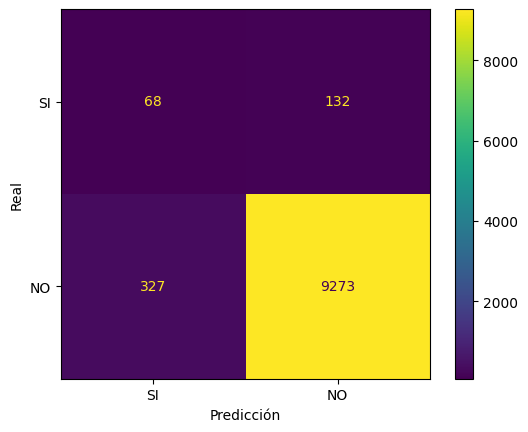

Metrica del negocio: $ 542.5


In [60]:
y_validacion_pred = clf.predict_proba(df_x_testing_tmp)
df_y_validacion_pred_proba = pd.DataFrame(y_validacion_pred, columns = ['NO_prob', 'SI_prob'])
df_y_validacion_pred_proba['prediccion'] = 'NO'
df_y_validacion_pred_proba.loc[df_y_validacion_pred_proba['SI_prob']>punto_de_corte, 'prediccion'] = 'SI'

cm = confusion_matrix(df_y_testing, df_y_validacion_pred_proba['prediccion'], labels=['SI', 'NO'])
true_positives = cm[0,0]
true_negatives = cm[1,1]
false_positives = cm[1, 0]
false_negatives = cm[0,1]
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['SI', 'NO'])
disp.plot()
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.show()

metrica_negocio = ((4000*true_positives) - (500*false_positives))/(true_positives + false_negatives)
print("Metrica del negocio: $", metrica_negocio)

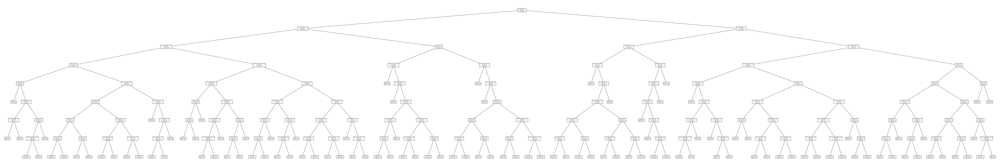

In [61]:
fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_1_original.png',format='png',bbox_inches = "tight", dpi=240)

In [62]:
prune_tree(clf.tree_, punto_de_corte)

-1

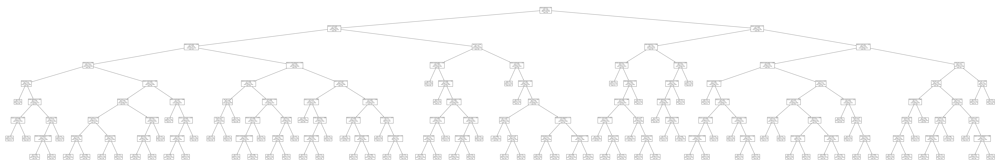

In [63]:
prune_tree(clf.tree_, punto_de_corte)
fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_1_prunned.png',format='png',bbox_inches = "tight", dpi=240)

### Importancia de las variables en el árbol

In [24]:
d = {'features': columnas, 'importance': clf.feature_importances_}
df = pd.DataFrame(data= d).sort_values(by=['importance'],ascending=False)
df

,features,importance
16,relacion_overall_taste,0.243858
15,relacion_overall_palate,0.213463
2,review_appearance,0.181836
1,review_aroma,0.084854
13,relacion_overall_aroma,0.073178
5,beer_abv,0.068645
14,relacion_overall_appearance,0.058395
4,review_taste,0.027530
3,review_palate,0.021995
0,review_overall,0.012758


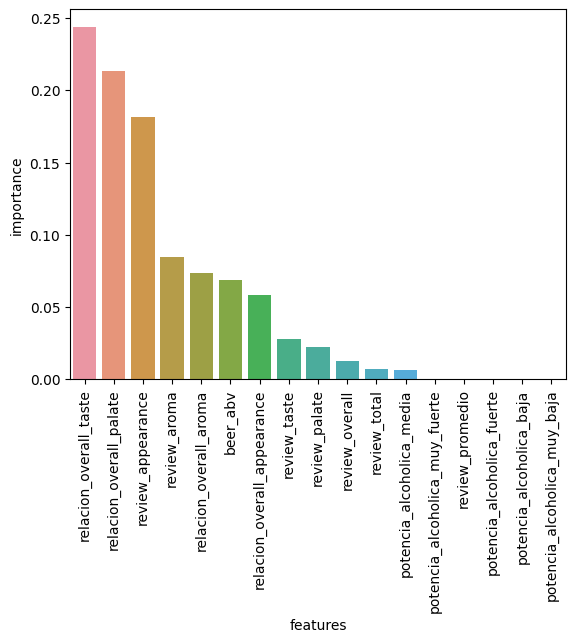

In [25]:
g = sns.barplot(data=df, x="features", y="importance")
plt.setp(g.get_xticklabels(), rotation=90)
plt.show()

## ¿Qué pasa si elminamos variables?

### Eliminemos las que menos aportan

[1, [0.1042759991723782, 52, 8809, 8711], 0.0]
[2, [0.10588974211893269, 52, 9007, 6140], 0.0]
[3, [0.10964169070397224, 44, 6029, 2733], 0.0]
[4, [0.11253308201099622, 30, 7223, 7869], 0.0]
[5, [0.10281642852188151, 18, 1670, 8412], 0.0]
[6, [0.11702949212719985, 29, 2736, 8162], 0.0]
[7, [0.1111014412174576, 47, 7507, 980], 0.0]
[8, [0.11592427559085738, 25, 1885, 6687], 0.0]
[9, [0.11697038348605615, 8, 9104, 1900], 0.0]
[10, [0.11395457979170637, 26, 356, 375], 279.91]
[11, [0.12, 100, 2, 10000], 0.0]
[12, [0.1, 100, 2, 1], 124.06]
[13, [0.1, 1, 2, 1], 0.0]
[14, [0.1152246963685009, 61, 2, 1], 124.06]
[15, [0.1153230633471873, 16, 99, 278], 308.69]
[16, [0.11870205647836504, 19, 2, 1], 203.82]
[17, [0.1135508812174295, 1, 2, 1], 0.0]
[18, [0.11327031324911259, 20, 2, 1], 250.51]
[19, [0.10336166240458021, 21, 2, 1666], 0.0]
[20, [0.11566112467521668, 21, 1150, 1], 324.74]
[21, [0.11570815609960239, 22, 2, 911], 177.98]
[22, [0.11571796716075551, 22, 8823, 278], 0.0]
[23, [0.1146851

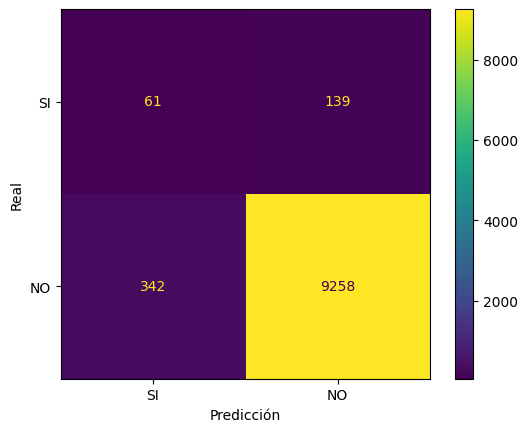

Metrica del negocio: $ 365.0
                       features  importance
10       relacion_overall_taste    0.242593
9       relacion_overall_palate    0.227752
2             review_appearance    0.180046
7        relacion_overall_aroma    0.097240
8   relacion_overall_appearance    0.088061
5                      beer_abv    0.044203
1                  review_aroma    0.041282
4                  review_taste    0.041141
6                  review_total    0.029402
0                review_overall    0.007915
3                 review_palate    0.000365


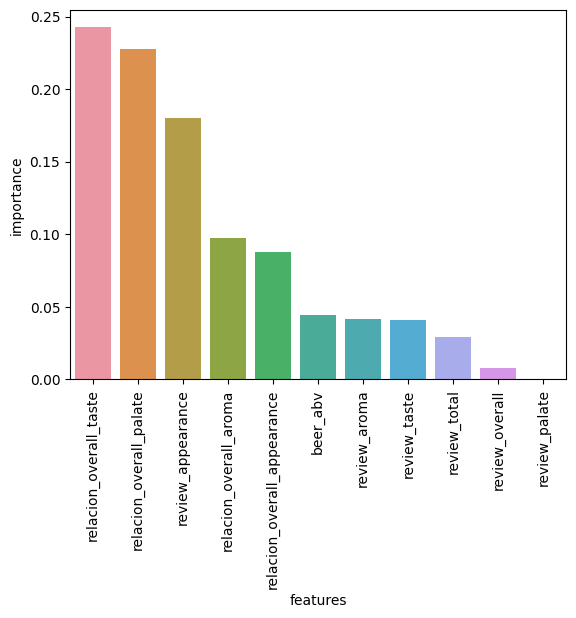

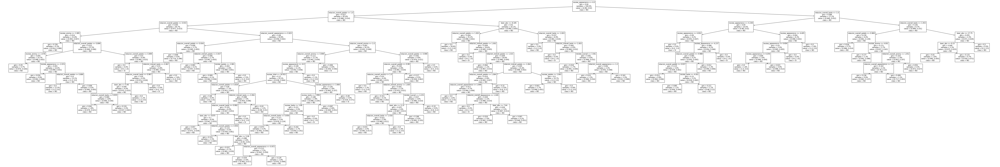

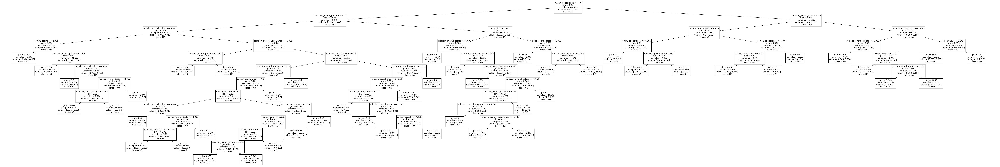

In [27]:
# Las columnas que deseamos mantener
columnas = [
    "review_overall",
    "review_aroma",
    "review_appearance",
    "review_palate",
    "review_taste",
    "beer_abv",
    #"potencia_alcoholica",
    #"potencia_alcoholica_muy_baja",
    #"potencia_alcoholica_baja",
    #"potencia_alcoholica_media",
    #"potencia_alcoholica_fuerte",
    #"potencia_alcoholica_muy_fuerte",
    #"review_promedio",
    "review_total",
    'relacion_overall_aroma',
    'relacion_overall_appearance',
    'relacion_overall_palate',
    'relacion_overall_taste',
]

#Adaptamos los datasets de training y testing para contener solo las columnas deseadas
df_x_training_validacion_tmp = df_x_training_validacion_fe[columnas]
df_x_testing_tmp = df_x_testing_fe[columnas]


#Definimos el espacio de busqueda de hiper-parametros
space  = [
    Real(0.10, 0.12, name='umbral_corte'),
    Integer(1, 100, name = 'max_depth'),
    Integer(2, 10000, name = 'min_samples_split'), 
    Integer(1, 10000, name = 'min_samples_leaf')
]


#LA función de minimización
res = gp_minimize(cv_con_umbral_de_corte,                  # the function to minimize
                  space,     # the bounds on each dimension of x
                  n_initial_points = 10,
                  n_calls=100,         # the number of evaluations of f including at x0
                  n_random_starts=10,  # the number of random initialization points
                  random_state= random_state,
                  acq_func = "LCB",
                  callback = lambda res: print([
                          len(res.func_vals), 
                          res.x_iters[len(res.x_iters)-1], 
                          -res.func_vals[len(res.func_vals)-1]
                      ])
                 )
#imprimimos los mejores hiperparametros y la funcion de ganancia
print([res.x, -res.fun])

#Establecemos los mejores paámetros
punto_de_corte = res.x[0]
max_depth = res.x[1]
min_samples_split = res.x[2]
min_samples_leaf = res.x[3]

#Generamos y entrenamos el modelo con los datos de training
clf = DecisionTreeClassifier(
            criterion = criterion,
            max_depth = max_depth,
            min_samples_split = min_samples_split,
            min_samples_leaf = min_samples_leaf,
            random_state = random_state
        )
_ = clf.fit(df_x_training_validacion_tmp, df_y_training_validacion)

#Realizamos la predicción con los datos de testing
y_validacion_pred = clf.predict_proba(df_x_testing_tmp)
df_y_validacion_pred_proba = pd.DataFrame(y_validacion_pred, columns = ['NO_prob', 'SI_prob'])
df_y_validacion_pred_proba['prediccion'] = 'NO'
df_y_validacion_pred_proba.loc[df_y_validacion_pred_proba['SI_prob']>punto_de_corte, 'prediccion'] = 'SI'

#mostramos la matriz de confusión
cm = confusion_matrix(df_y_testing, df_y_validacion_pred_proba['prediccion'], labels=['SI', 'NO'])
true_positives = cm[0,0]
true_negatives = cm[1,1]
false_positives = cm[1, 0]
false_negatives = cm[0,1]
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['SI', 'NO'])
disp.plot()
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.show()

#calculamos y mostramos la metrica del negocio
metrica_negocio = ((4000*true_positives) - (500*false_positives))/(true_positives + false_negatives)
print("Metrica del negocio: $", metrica_negocio)

#importancia de las variables
d = {'features': columnas, 'importance': clf.feature_importances_}
df = pd.DataFrame(data= d).sort_values(by=['importance'],ascending=False)
print(df)

g = sns.barplot(data=df, x="features", y="importance")
plt.setp(g.get_xticklabels(), rotation=90)
plt.show()

fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_2_original.png',format='png',bbox_inches = "tight", dpi=240)
prune_tree(clf.tree_, punto_de_corte)
fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_2_prunned.png',format='png',bbox_inches = "tight", dpi=240)

### Eliminemos relacion_overall_taste

[1, [0.1042759991723782, 52, 8809, 8711], 0.0]
[2, [0.10588974211893269, 52, 9007, 6140], 0.0]
[3, [0.10964169070397224, 44, 6029, 2733], 0.0]
[4, [0.11253308201099622, 30, 7223, 7869], 0.0]
[5, [0.10281642852188151, 18, 1670, 8412], 0.0]
[6, [0.11702949212719985, 29, 2736, 8162], 0.0]
[7, [0.1111014412174576, 47, 7507, 980], 0.0]
[8, [0.11592427559085738, 25, 1885, 6687], 0.0]
[9, [0.11697038348605615, 8, 9104, 1900], 0.0]
[10, [0.11395457979170637, 26, 356, 375], 177.8]
[11, [0.12, 100, 2, 10000], 0.0]
[12, [0.1, 100, 2, 1], 56.48]
[13, [0.1, 1, 2, 1], 0.0]
[14, [0.11612437863956201, 68, 2, 1], 56.48]
[15, [0.11610961735931155, 19, 2, 1], 89.09]
[16, [0.11231429118697633, 11, 447, 1303], -36.75]
[17, [0.11743519618541122, 27, 2, 1266], 0.0]
[18, [0.11561589334983191, 3, 483, 384], -26.45]
[19, [0.11788556873582265, 28, 988, 206], 198.09]
[20, [0.10074803188992783, 31, 775, 278], 164.81]
[21, [0.11007358424301872, 27, 9098, 1], 0.0]
[22, [0.11167483743928885, 28, 2, 65], 186.5]
[23, [

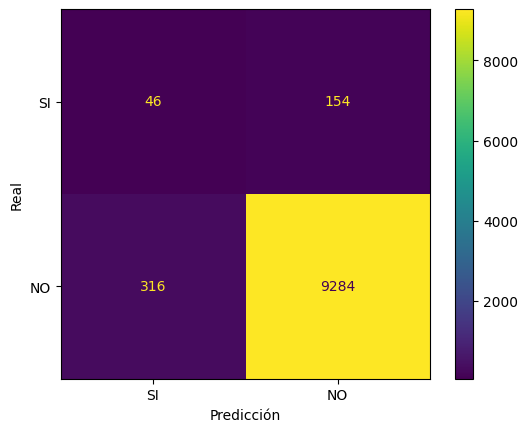

Metrica del negocio: $ 130.0
                      features  importance
2            review_appearance    0.326222
9      relacion_overall_palate    0.177721
8  relacion_overall_appearance    0.164018
4                 review_taste    0.084101
7       relacion_overall_aroma    0.083682
5                     beer_abv    0.067823
3                review_palate    0.048072
6                 review_total    0.028255
0               review_overall    0.011540
1                 review_aroma    0.008566


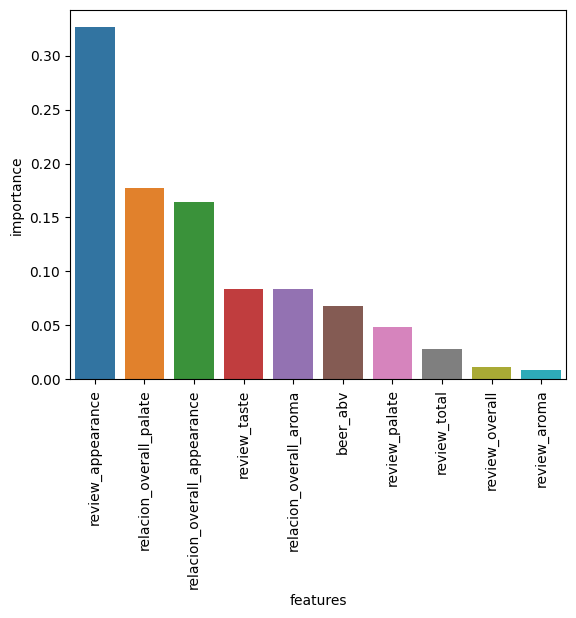

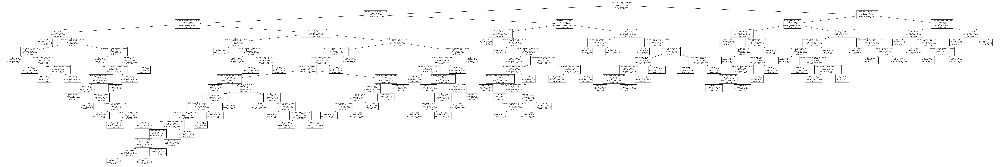

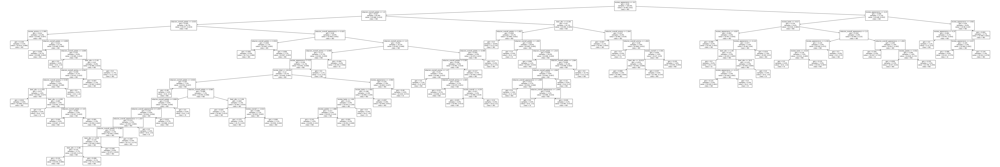

In [28]:
# Las columnas que deseamos mantener
columnas = [
    "review_overall",
    "review_aroma",
    "review_appearance",
    "review_palate",
    "review_taste",
    "beer_abv",
    #"potencia_alcoholica",
    #"potencia_alcoholica_muy_baja",
    #"potencia_alcoholica_baja",
    #"potencia_alcoholica_media",
    #"potencia_alcoholica_fuerte",
    #"potencia_alcoholica_muy_fuerte",
    #"review_promedio",
    "review_total",
    'relacion_overall_aroma',
    'relacion_overall_appearance',
    'relacion_overall_palate',
    #'relacion_overall_taste',
]

#Adaptamos los datasets de training y testing para contener solo las columnas deseadas
df_x_training_validacion_tmp = df_x_training_validacion_fe[columnas]
df_x_testing_tmp = df_x_testing_fe[columnas]


#Definimos el espacio de busqueda de hiper-parametros
space  = [
    Real(0.10, 0.12, name='umbral_corte'),
    Integer(1, 100, name = 'max_depth'),
    Integer(2, 10000, name = 'min_samples_split'), 
    Integer(1, 10000, name = 'min_samples_leaf')
]


#LA función de minimización
res = gp_minimize(cv_con_umbral_de_corte,                  # the function to minimize
                  space,     # the bounds on each dimension of x
                  n_initial_points = 10,
                  n_calls=100,         # the number of evaluations of f including at x0
                  n_random_starts=10,  # the number of random initialization points
                  random_state= random_state,
                  acq_func = "LCB",
                  callback = lambda res: print([
                          len(res.func_vals), 
                          res.x_iters[len(res.x_iters)-1], 
                          -res.func_vals[len(res.func_vals)-1]
                      ])
                 )
#imprimimos los mejores hiperparametros y la funcion de ganancia
print([res.x, -res.fun])

#Establecemos los mejores paámetros
punto_de_corte = res.x[0]
max_depth = res.x[1]
min_samples_split = res.x[2]
min_samples_leaf = res.x[3]

#Generamos y entrenamos el modelo con los datos de training
clf = DecisionTreeClassifier(
            criterion = criterion,
            max_depth = max_depth,
            min_samples_split = min_samples_split,
            min_samples_leaf = min_samples_leaf,
            random_state = random_state
        )
_ = clf.fit(df_x_training_validacion_tmp, df_y_training_validacion)

#Realizamos la predicción con los datos de testing
y_validacion_pred = clf.predict_proba(df_x_testing_tmp)
df_y_validacion_pred_proba = pd.DataFrame(y_validacion_pred, columns = ['NO_prob', 'SI_prob'])
df_y_validacion_pred_proba['prediccion'] = 'NO'
df_y_validacion_pred_proba.loc[df_y_validacion_pred_proba['SI_prob']>punto_de_corte, 'prediccion'] = 'SI'

#mostramos la matriz de confusión
cm = confusion_matrix(df_y_testing, df_y_validacion_pred_proba['prediccion'], labels=['SI', 'NO'])
true_positives = cm[0,0]
true_negatives = cm[1,1]
false_positives = cm[1, 0]
false_negatives = cm[0,1]
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['SI', 'NO'])
disp.plot()
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.show()

#calculamos y mostramos la metrica del negocio
metrica_negocio = ((4000*true_positives) - (500*false_positives))/(true_positives + false_negatives)
print("Metrica del negocio: $", metrica_negocio)

#importancia de las variables
d = {'features': columnas, 'importance': clf.feature_importances_}
df = pd.DataFrame(data= d).sort_values(by=['importance'],ascending=False)
print(df)

g = sns.barplot(data=df, x="features", y="importance")
plt.setp(g.get_xticklabels(), rotation=90)
plt.show()

fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_3_original.png',format='png',bbox_inches = "tight", dpi=240)
prune_tree(clf.tree_, punto_de_corte)
fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_3_prunned.png',format='png',bbox_inches = "tight", dpi=240)

### Eliminamos review_appearance

[1, [0.1042759991723782, 52, 8809, 8711], 0.0]
[2, [0.10588974211893269, 52, 9007, 6140], 0.0]
[3, [0.10964169070397224, 44, 6029, 2733], 0.0]
[4, [0.11253308201099622, 30, 7223, 7869], 0.0]
[5, [0.10281642852188151, 18, 1670, 8412], 0.0]
[6, [0.11702949212719985, 29, 2736, 8162], 0.0]
[7, [0.1111014412174576, 47, 7507, 980], 0.0]
[8, [0.11592427559085738, 25, 1885, 6687], 0.0]
[9, [0.11697038348605615, 8, 9104, 1900], 0.0]
[10, [0.11395457979170637, 26, 356, 375], 240.69]
[11, [0.12, 100, 2, 10000], 0.0]
[12, [0.1, 100, 2, 1], 169.98]
[13, [0.1, 1, 2, 1], 0.0]
[14, [0.11373122273543185, 64, 2, 1], 169.98]
[15, [0.11807139957463655, 19, 2, 1], 259.17]
[16, [0.11640506092493802, 1, 2, 1], 0.0]
[17, [0.11951576689699285, 22, 10000, 1], 0.0]
[18, [0.10434372575112386, 21, 1657, 1], -25.38]
[19, [0.12, 27, 2, 10000], 0.0]
[20, [0.11956786669007752, 27, 2, 1], 170.05]
[21, [0.10104044284893172, 20, 358, 1], 335.34]
[22, [0.11959894565364987, 19, 399, 1824], 0.0]
[23, [0.11680159932053538, 1

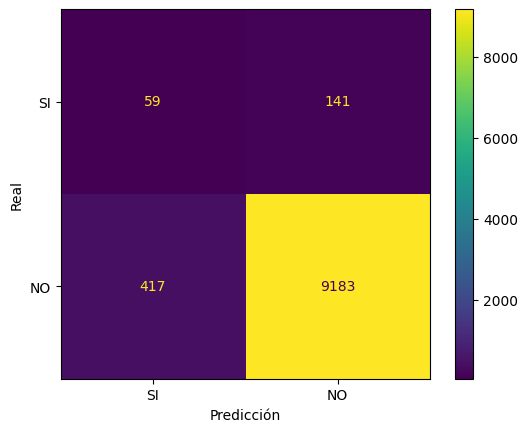

Metrica del negocio: $ 137.5
                      features  importance
1                 review_aroma    0.286626
8      relacion_overall_palate    0.190201
7  relacion_overall_appearance    0.140206
3                 review_taste    0.132498
2                review_palate    0.092658
6       relacion_overall_aroma    0.086592
4                     beer_abv    0.042730
5                 review_total    0.028489
0               review_overall    0.000000


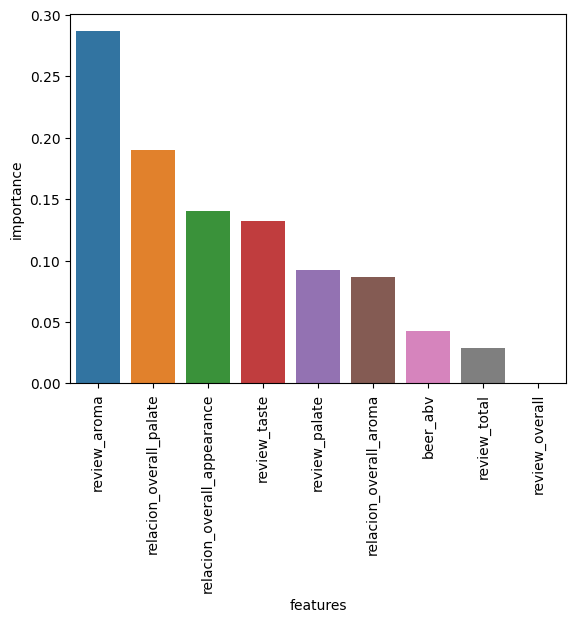

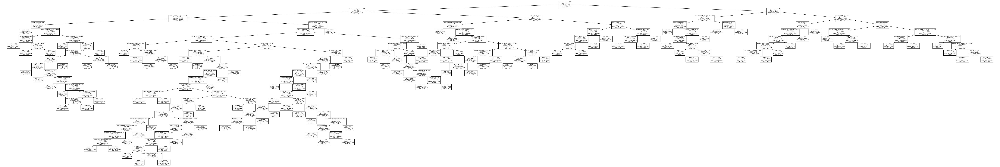

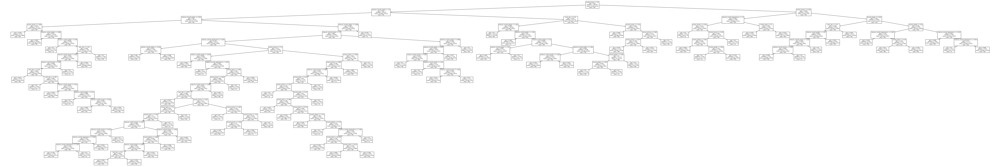

In [29]:
# Las columnas que deseamos mantener
columnas = [
    "review_overall",
    "review_aroma",
    #"review_appearance",
    "review_palate",
    "review_taste",
    "beer_abv",
    #"potencia_alcoholica",
    #"potencia_alcoholica_muy_baja",
    #"potencia_alcoholica_baja",
    #"potencia_alcoholica_media",
    #"potencia_alcoholica_fuerte",
    #"potencia_alcoholica_muy_fuerte",
    #"review_promedio",
    "review_total",
    'relacion_overall_aroma',
    'relacion_overall_appearance',
    'relacion_overall_palate',
    #'relacion_overall_taste',
]

#Adaptamos los datasets de training y testing para contener solo las columnas deseadas
df_x_training_validacion_tmp = df_x_training_validacion_fe[columnas]
df_x_testing_tmp = df_x_testing_fe[columnas]


#Definimos el espacio de busqueda de hiper-parametros
space  = [
    Real(0.10, 0.12, name='umbral_corte'),
    Integer(1, 100, name = 'max_depth'),
    Integer(2, 10000, name = 'min_samples_split'), 
    Integer(1, 10000, name = 'min_samples_leaf')
]


#LA función de minimización
res = gp_minimize(cv_con_umbral_de_corte,                  # the function to minimize
                  space,     # the bounds on each dimension of x
                  n_initial_points = 10,
                  n_calls=100,         # the number of evaluations of f including at x0
                  n_random_starts=10,  # the number of random initialization points
                  random_state= random_state,
                  acq_func = "LCB",
                  callback = lambda res: print([
                          len(res.func_vals), 
                          res.x_iters[len(res.x_iters)-1], 
                          -res.func_vals[len(res.func_vals)-1]
                      ])
                 )
#imprimimos los mejores hiperparametros y la funcion de ganancia
print([res.x, -res.fun])

#Establecemos los mejores paámetros
punto_de_corte = res.x[0]
max_depth = res.x[1]
min_samples_split = res.x[2]
min_samples_leaf = res.x[3]

#Generamos y entrenamos el modelo con los datos de training
clf = DecisionTreeClassifier(
            criterion = criterion,
            max_depth = max_depth,
            min_samples_split = min_samples_split,
            min_samples_leaf = min_samples_leaf,
            random_state = random_state
        )
_ = clf.fit(df_x_training_validacion_tmp, df_y_training_validacion)

#Realizamos la predicción con los datos de testing
y_validacion_pred = clf.predict_proba(df_x_testing_tmp)
df_y_validacion_pred_proba = pd.DataFrame(y_validacion_pred, columns = ['NO_prob', 'SI_prob'])
df_y_validacion_pred_proba['prediccion'] = 'NO'
df_y_validacion_pred_proba.loc[df_y_validacion_pred_proba['SI_prob']>punto_de_corte, 'prediccion'] = 'SI'

#mostramos la matriz de confusión
cm = confusion_matrix(df_y_testing, df_y_validacion_pred_proba['prediccion'], labels=['SI', 'NO'])
true_positives = cm[0,0]
true_negatives = cm[1,1]
false_positives = cm[1, 0]
false_negatives = cm[0,1]
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['SI', 'NO'])
disp.plot()
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.show()

#calculamos y mostramos la metrica del negocio
metrica_negocio = ((4000*true_positives) - (500*false_positives))/(true_positives + false_negatives)
print("Metrica del negocio: $", metrica_negocio)

#importancia de las variables
d = {'features': columnas, 'importance': clf.feature_importances_}
df = pd.DataFrame(data= d).sort_values(by=['importance'],ascending=False)
print(df)

g = sns.barplot(data=df, x="features", y="importance")
plt.setp(g.get_xticklabels(), rotation=90)
plt.show()

fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_4_original.png',format='png',bbox_inches = "tight", dpi=240)
prune_tree(clf.tree_, punto_de_corte)
fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_4_prunned.png',format='png',bbox_inches = "tight", dpi=240)

### Eliminamos review_aroma

[1, [0.1042759991723782, 52, 8809, 8711], 0.0]
[2, [0.10588974211893269, 52, 9007, 6140], 0.0]
[3, [0.10964169070397224, 44, 6029, 2733], 0.0]
[4, [0.11253308201099622, 30, 7223, 7869], 0.0]
[5, [0.10281642852188151, 18, 1670, 8412], 0.0]
[6, [0.11702949212719985, 29, 2736, 8162], 0.0]
[7, [0.1111014412174576, 47, 7507, 980], 0.0]
[8, [0.11592427559085738, 25, 1885, 6687], 0.0]
[9, [0.11697038348605615, 8, 9104, 1900], 0.0]
[10, [0.11395457979170637, 26, 356, 375], 155.21]
[11, [0.12, 100, 2, 10000], 0.0]
[12, [0.1, 100, 2, 1], 168.19]
[13, [0.12, 1, 2, 1], 0.0]
[14, [0.10715849730737266, 13, 161, 3547], 0.0]
[15, [0.1, 97, 38, 3250], 0.0]
[16, [0.1129891951266181, 26, 2, 222], 221.34]
[17, [0.10917538598560501, 26, 2, 1990], 0.0]
[18, [0.1022223181390713, 24, 154, 1], 183.28]
[19, [0.10667969029525641, 26, 5682, 203], 1.99]
[20, [0.10018128896679805, 30, 2, 48], 140.41]
[21, [0.10876629851479308, 100, 2, 1], 168.19]
[22, [0.11359617854360274, 24, 2, 411], 209.17]
[23, [0.1121814063692

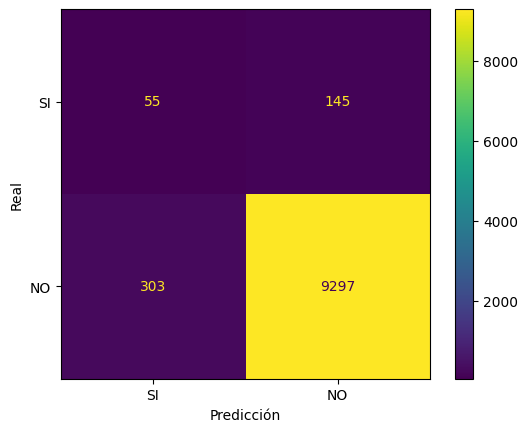

Metrica del negocio: $ 342.5
                      features  importance
6  relacion_overall_appearance    0.385413
7      relacion_overall_palate    0.174444
2                 review_taste    0.164401
1                review_palate    0.118035
5       relacion_overall_aroma    0.056196
4                 review_total    0.046649
0               review_overall    0.030327
3                     beer_abv    0.024536


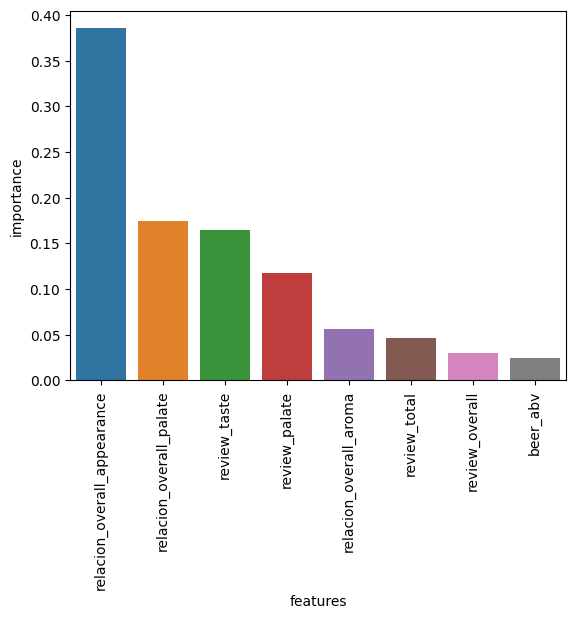

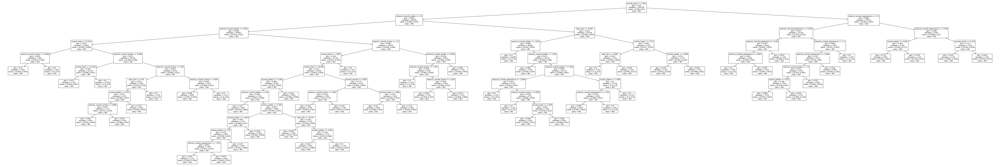

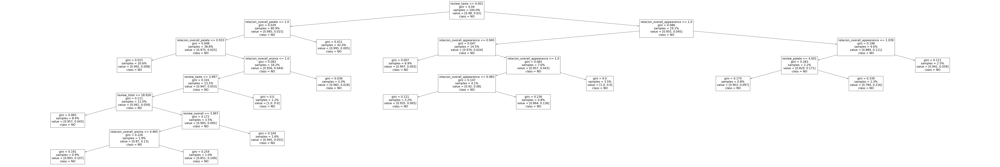

In [30]:
# Las columnas que deseamos mantener
columnas = [
    "review_overall",
    #"review_aroma",
    #"review_appearance",
    "review_palate",
    "review_taste",
    "beer_abv",
    #"potencia_alcoholica",
    #"potencia_alcoholica_muy_baja",
    #"potencia_alcoholica_baja",
    #"potencia_alcoholica_media",
    #"potencia_alcoholica_fuerte",
    #"potencia_alcoholica_muy_fuerte",
    #"review_promedio",
    "review_total",
    'relacion_overall_aroma',
    'relacion_overall_appearance',
    'relacion_overall_palate',
    #'relacion_overall_taste',
]

#Adaptamos los datasets de training y testing para contener solo las columnas deseadas
df_x_training_validacion_tmp = df_x_training_validacion_fe[columnas]
df_x_testing_tmp = df_x_testing_fe[columnas]


#Definimos el espacio de busqueda de hiper-parametros
space  = [
    Real(0.10, 0.12, name='umbral_corte'),
    Integer(1, 100, name = 'max_depth'),
    Integer(2, 10000, name = 'min_samples_split'), 
    Integer(1, 10000, name = 'min_samples_leaf')
]


#LA función de minimización
res = gp_minimize(cv_con_umbral_de_corte,                  # the function to minimize
                  space,     # the bounds on each dimension of x
                  n_initial_points = 10,
                  n_calls=100,         # the number of evaluations of f including at x0
                  n_random_starts=10,  # the number of random initialization points
                  random_state= random_state,
                  acq_func = "LCB",
                  callback = lambda res: print([
                          len(res.func_vals), 
                          res.x_iters[len(res.x_iters)-1], 
                          -res.func_vals[len(res.func_vals)-1]
                      ])
                 )
#imprimimos los mejores hiperparametros y la funcion de ganancia
print([res.x, -res.fun])

#Establecemos los mejores paámetros
punto_de_corte = res.x[0]
max_depth = res.x[1]
min_samples_split = res.x[2]
min_samples_leaf = res.x[3]

#Generamos y entrenamos el modelo con los datos de training
clf = DecisionTreeClassifier(
            criterion = criterion,
            max_depth = max_depth,
            min_samples_split = min_samples_split,
            min_samples_leaf = min_samples_leaf,
            random_state = random_state
        )
_ = clf.fit(df_x_training_validacion_tmp, df_y_training_validacion)

#Realizamos la predicción con los datos de testing
y_validacion_pred = clf.predict_proba(df_x_testing_tmp)
df_y_validacion_pred_proba = pd.DataFrame(y_validacion_pred, columns = ['NO_prob', 'SI_prob'])
df_y_validacion_pred_proba['prediccion'] = 'NO'
df_y_validacion_pred_proba.loc[df_y_validacion_pred_proba['SI_prob']>punto_de_corte, 'prediccion'] = 'SI'

#mostramos la matriz de confusión
cm = confusion_matrix(df_y_testing, df_y_validacion_pred_proba['prediccion'], labels=['SI', 'NO'])
true_positives = cm[0,0]
true_negatives = cm[1,1]
false_positives = cm[1, 0]
false_negatives = cm[0,1]
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['SI', 'NO'])
disp.plot()
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.show()

#calculamos y mostramos la metrica del negocio
metrica_negocio = ((4000*true_positives) - (500*false_positives))/(true_positives + false_negatives)
print("Metrica del negocio: $", metrica_negocio)

#importancia de las variables
d = {'features': columnas, 'importance': clf.feature_importances_}
df = pd.DataFrame(data= d).sort_values(by=['importance'],ascending=False)
print(df)

g = sns.barplot(data=df, x="features", y="importance")
plt.setp(g.get_xticklabels(), rotation=90)
plt.show()

fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_5_original.png',format='png',bbox_inches = "tight", dpi=240)
prune_tree(clf.tree_, punto_de_corte)
fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_5_prunned.png',format='png',bbox_inches = "tight", dpi=240)

### Eliminamos relacion_overall_appearance

[1, [0.1042759991723782, 52, 8809, 8711], 0.0]
[2, [0.10588974211893269, 52, 9007, 6140], 0.0]
[3, [0.10964169070397224, 44, 6029, 2733], 0.0]
[4, [0.11253308201099622, 30, 7223, 7869], 0.0]
[5, [0.10281642852188151, 18, 1670, 8412], 0.0]
[6, [0.11702949212719985, 29, 2736, 8162], 0.0]
[7, [0.1111014412174576, 47, 7507, 980], 0.0]
[8, [0.11592427559085738, 25, 1885, 6687], 0.0]
[9, [0.11697038348605615, 8, 9104, 1900], 0.0]
[10, [0.11395457979170637, 26, 356, 375], 224.4]
[11, [0.12, 100, 2, 10000], 0.0]
[12, [0.1, 100, 2, 1], 108.5]
[13, [0.1, 1, 2, 1], 0.0]
[14, [0.11496127440305233, 60, 2, 1], 108.5]
[15, [0.11535505494280635, 15, 83, 278], 265.9]
[16, [0.11935418707684879, 8, 2, 1], 267.33]
[17, [0.11599257616375465, 1, 2, 1], 0.0]
[18, [0.11792020644726826, 11, 1526, 1], 110.27]
[19, [0.11987682281295288, 11, 2, 3702], 0.0]
[20, [0.10517356434303772, 11, 2, 1], 314.1]
[21, [0.11781161246904813, 11, 2, 643], 224.0]
[22, [0.11947362488752719, 12, 368, 1], 294.07]
[23, [0.10010703627

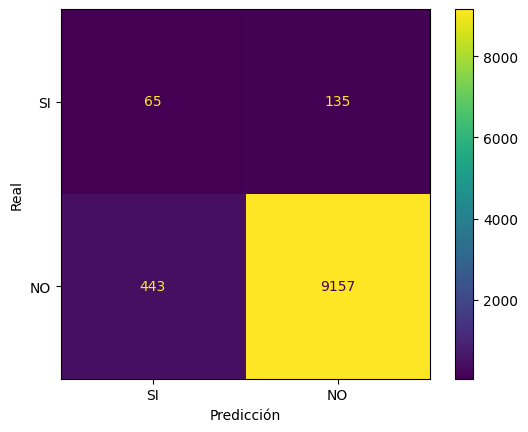

Metrica del negocio: $ 192.5
                  features  importance
2             review_taste    0.246588
1            review_palate    0.199368
6  relacion_overall_palate    0.177857
5   relacion_overall_aroma    0.113735
0           review_overall    0.110582
4             review_total    0.105026
3                 beer_abv    0.046844


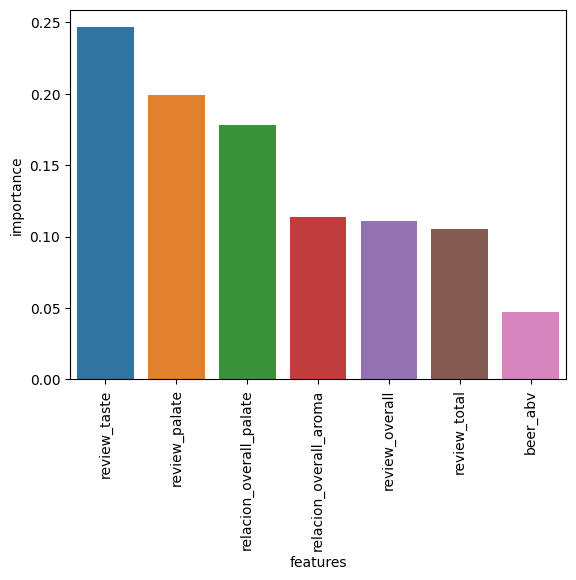

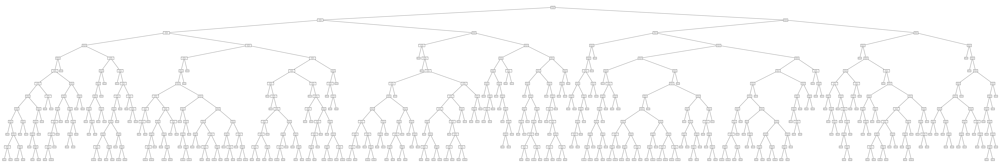

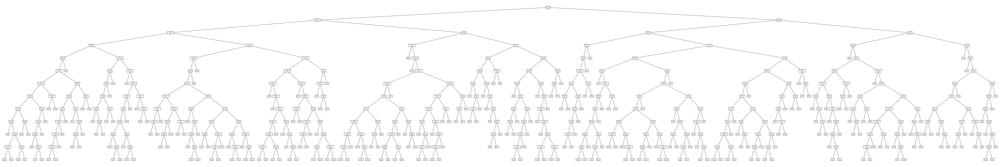

In [31]:
# Las columnas que deseamos mantener
columnas = [
    "review_overall",
    #"review_aroma",
    #"review_appearance",
    "review_palate",
    "review_taste",
    "beer_abv",
    #"potencia_alcoholica",
    #"potencia_alcoholica_muy_baja",
    #"potencia_alcoholica_baja",
    #"potencia_alcoholica_media",
    #"potencia_alcoholica_fuerte",
    #"potencia_alcoholica_muy_fuerte",
    #"review_promedio",
    "review_total",
    'relacion_overall_aroma',
    #'relacion_overall_appearance',
    'relacion_overall_palate',
    #'relacion_overall_taste',
]

#Adaptamos los datasets de training y testing para contener solo las columnas deseadas
df_x_training_validacion_tmp = df_x_training_validacion_fe[columnas]
df_x_testing_tmp = df_x_testing_fe[columnas]


#Definimos el espacio de busqueda de hiper-parametros
space  = [
    Real(0.10, 0.12, name='umbral_corte'),
    Integer(1, 100, name = 'max_depth'),
    Integer(2, 10000, name = 'min_samples_split'), 
    Integer(1, 10000, name = 'min_samples_leaf')
]


#LA función de minimización
res = gp_minimize(cv_con_umbral_de_corte,                  # the function to minimize
                  space,     # the bounds on each dimension of x
                  n_initial_points = 10,
                  n_calls=100,         # the number of evaluations of f including at x0
                  n_random_starts=10,  # the number of random initialization points
                  random_state= random_state,
                  acq_func = "LCB",
                  callback = lambda res: print([
                          len(res.func_vals), 
                          res.x_iters[len(res.x_iters)-1], 
                          -res.func_vals[len(res.func_vals)-1]
                      ])
                 )
#imprimimos los mejores hiperparametros y la funcion de ganancia
print([res.x, -res.fun])

#Establecemos los mejores paámetros
punto_de_corte = res.x[0]
max_depth = res.x[1]
min_samples_split = res.x[2]
min_samples_leaf = res.x[3]

#Generamos y entrenamos el modelo con los datos de training
clf = DecisionTreeClassifier(
            criterion = criterion,
            max_depth = max_depth,
            min_samples_split = min_samples_split,
            min_samples_leaf = min_samples_leaf,
            random_state = random_state
        )
_ = clf.fit(df_x_training_validacion_tmp, df_y_training_validacion)

#Realizamos la predicción con los datos de testing
y_validacion_pred = clf.predict_proba(df_x_testing_tmp)
df_y_validacion_pred_proba = pd.DataFrame(y_validacion_pred, columns = ['NO_prob', 'SI_prob'])
df_y_validacion_pred_proba['prediccion'] = 'NO'
df_y_validacion_pred_proba.loc[df_y_validacion_pred_proba['SI_prob']>punto_de_corte, 'prediccion'] = 'SI'

#mostramos la matriz de confusión
cm = confusion_matrix(df_y_testing, df_y_validacion_pred_proba['prediccion'], labels=['SI', 'NO'])
true_positives = cm[0,0]
true_negatives = cm[1,1]
false_positives = cm[1, 0]
false_negatives = cm[0,1]
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['SI', 'NO'])
disp.plot()
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.show()

#calculamos y mostramos la metrica del negocio
metrica_negocio = ((4000*true_positives) - (500*false_positives))/(true_positives + false_negatives)
print("Metrica del negocio: $", metrica_negocio)

#importancia de las variables
d = {'features': columnas, 'importance': clf.feature_importances_}
df = pd.DataFrame(data= d).sort_values(by=['importance'],ascending=False)
print(df)

g = sns.barplot(data=df, x="features", y="importance")
plt.setp(g.get_xticklabels(), rotation=90)
plt.show()

fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_6_original.png',format='png',bbox_inches = "tight", dpi=240)
prune_tree(clf.tree_, punto_de_corte)
fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_6_prunned.png',format='png',bbox_inches = "tight", dpi=240)

### Eliminamos review_taste

[1, [0.1042759991723782, 52, 8809, 8711], 0.0]
[2, [0.10588974211893269, 52, 9007, 6140], 0.0]
[3, [0.10964169070397224, 44, 6029, 2733], 0.0]
[4, [0.11253308201099622, 30, 7223, 7869], 0.0]
[5, [0.10281642852188151, 18, 1670, 8412], 0.0]
[6, [0.11702949212719985, 29, 2736, 8162], 0.0]
[7, [0.1111014412174576, 47, 7507, 980], 0.0]
[8, [0.11592427559085738, 25, 1885, 6687], 0.0]
[9, [0.11697038348605615, 8, 9104, 1900], 0.0]
[10, [0.11395457979170637, 26, 356, 375], 160.3]
[11, [0.12, 100, 2, 10000], 0.0]
[12, [0.1, 100, 2, 1], 45.75]
[13, [0.1, 1, 2, 1], 0.0]
[14, [0.11633079697163068, 72, 2, 1], 45.75]
[15, [0.11607639792251971, 19, 2, 1], 142.44]
[16, [0.11204941990325079, 20, 2, 1], 127.82]
[17, [0.11888254868368764, 33, 2, 1], 36.85]
[18, [0.11432011265540369, 7, 231, 1], 204.45]
[19, [0.11428874458448345, 1, 1575, 1], 0.0]
[20, [0.11506093573321795, 1, 360, 9511], 0.0]
[21, [0.11430239620559197, 1, 137, 1260], 0.0]
[22, [0.1132796039655288, 6, 274, 4283], 0.0]
[23, [0.104896003639

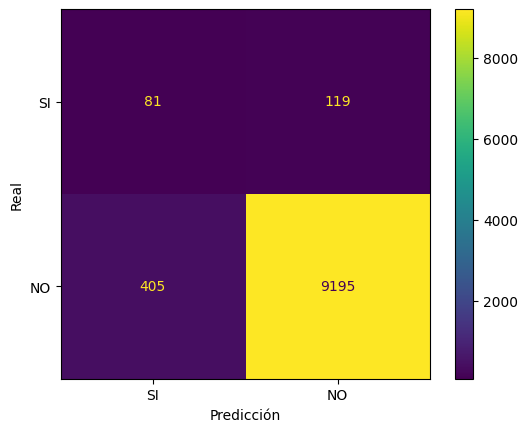

Metrica del negocio: $ 607.5
                  features  importance
5  relacion_overall_palate    0.370072
4   relacion_overall_aroma    0.241482
2                 beer_abv    0.152904
1            review_palate    0.117531
3             review_total    0.097403
0           review_overall    0.020608


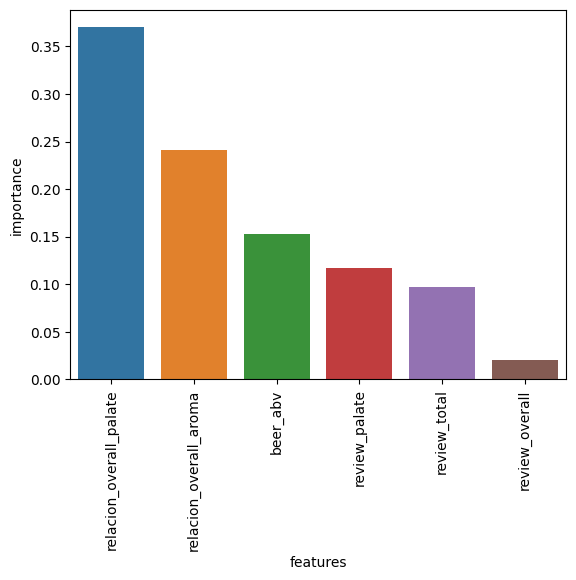

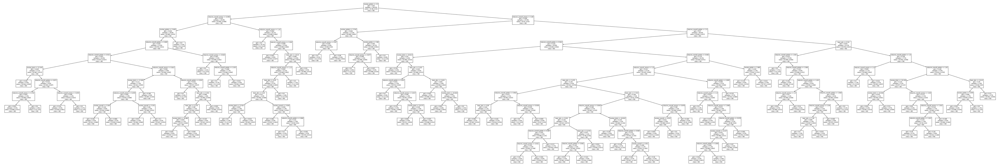

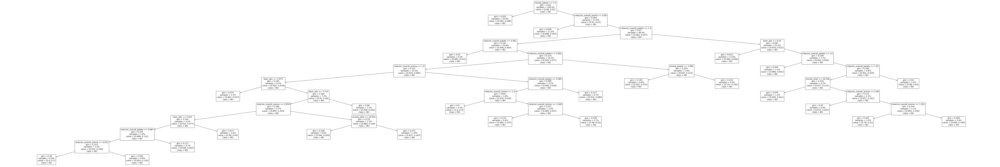

In [32]:
# Las columnas que deseamos mantener
columnas = [
    "review_overall",
    #"review_aroma",
    #"review_appearance",
    "review_palate",
    #"review_taste",
    "beer_abv",
    #"potencia_alcoholica",
    #"potencia_alcoholica_muy_baja",
    #"potencia_alcoholica_baja",
    #"potencia_alcoholica_media",
    #"potencia_alcoholica_fuerte",
    #"potencia_alcoholica_muy_fuerte",
    #"review_promedio",
    "review_total",
    'relacion_overall_aroma',
    #'relacion_overall_appearance',
    'relacion_overall_palate',
    #'relacion_overall_taste',
]

#Adaptamos los datasets de training y testing para contener solo las columnas deseadas
df_x_training_validacion_tmp = df_x_training_validacion_fe[columnas]
df_x_testing_tmp = df_x_testing_fe[columnas]


#Definimos el espacio de busqueda de hiper-parametros
space  = [
    Real(0.10, 0.12, name='umbral_corte'),
    Integer(1, 100, name = 'max_depth'),
    Integer(2, 10000, name = 'min_samples_split'), 
    Integer(1, 10000, name = 'min_samples_leaf')
]


#LA función de minimización
res = gp_minimize(cv_con_umbral_de_corte,                  # the function to minimize
                  space,     # the bounds on each dimension of x
                  n_initial_points = 10,
                  n_calls=100,         # the number of evaluations of f including at x0
                  n_random_starts=10,  # the number of random initialization points
                  random_state= random_state,
                  acq_func = "LCB",
                  callback = lambda res: print([
                          len(res.func_vals), 
                          res.x_iters[len(res.x_iters)-1], 
                          -res.func_vals[len(res.func_vals)-1]
                      ])
                 )
#imprimimos los mejores hiperparametros y la funcion de ganancia
print([res.x, -res.fun])

#Establecemos los mejores paámetros
punto_de_corte = res.x[0]
max_depth = res.x[1]
min_samples_split = res.x[2]
min_samples_leaf = res.x[3]

#Generamos y entrenamos el modelo con los datos de training
clf = DecisionTreeClassifier(
            criterion = criterion,
            max_depth = max_depth,
            min_samples_split = min_samples_split,
            min_samples_leaf = min_samples_leaf,
            random_state = random_state
        )
_ = clf.fit(df_x_training_validacion_tmp, df_y_training_validacion)

#Realizamos la predicción con los datos de testing
y_validacion_pred = clf.predict_proba(df_x_testing_tmp)
df_y_validacion_pred_proba = pd.DataFrame(y_validacion_pred, columns = ['NO_prob', 'SI_prob'])
df_y_validacion_pred_proba['prediccion'] = 'NO'
df_y_validacion_pred_proba.loc[df_y_validacion_pred_proba['SI_prob']>punto_de_corte, 'prediccion'] = 'SI'

#mostramos la matriz de confusión
cm = confusion_matrix(df_y_testing, df_y_validacion_pred_proba['prediccion'], labels=['SI', 'NO'])
true_positives = cm[0,0]
true_negatives = cm[1,1]
false_positives = cm[1, 0]
false_negatives = cm[0,1]
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['SI', 'NO'])
disp.plot()
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.show()

#calculamos y mostramos la metrica del negocio
metrica_negocio = ((4000*true_positives) - (500*false_positives))/(true_positives + false_negatives)
print("Metrica del negocio: $", metrica_negocio)

#importancia de las variables
d = {'features': columnas, 'importance': clf.feature_importances_}
df = pd.DataFrame(data= d).sort_values(by=['importance'],ascending=False)
print(df)

g = sns.barplot(data=df, x="features", y="importance")
plt.setp(g.get_xticklabels(), rotation=90)
plt.show()

fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_7_original.png',format='png',bbox_inches = "tight", dpi=240)
prune_tree(clf.tree_, punto_de_corte)
fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_7_prunned.png',format='png',bbox_inches = "tight", dpi=240)

### Eliminamos relacion_overall_palate

[1, [0.1042759991723782, 52, 8809, 8711], 0.0]
[2, [0.10588974211893269, 52, 9007, 6140], 0.0]
[3, [0.10964169070397224, 44, 6029, 2733], 0.0]
[4, [0.11253308201099622, 30, 7223, 7869], 0.0]
[5, [0.10281642852188151, 18, 1670, 8412], 0.0]
[6, [0.11702949212719985, 29, 2736, 8162], 0.0]
[7, [0.1111014412174576, 47, 7507, 980], 0.0]
[8, [0.11592427559085738, 25, 1885, 6687], 0.0]
[9, [0.11697038348605615, 8, 9104, 1900], 0.0]
[10, [0.11395457979170637, 26, 356, 375], 171.67]
[11, [0.12, 100, 2, 10000], 0.0]
[12, [0.1, 100, 2, 1], 212.18]
[13, [0.12, 100, 2, 1], 212.18]
[14, [0.1, 100, 2, 1], 212.18]
[15, [0.12, 100, 2, 1], 212.18]
[16, [0.1, 100, 2, 1], 212.18]
[17, [0.12, 100, 2, 1], 212.18]
[18, [0.1, 100, 2, 1], 212.18]
[19, [0.12, 100, 2, 1], 212.18]
[20, [0.1, 100, 2, 1], 212.18]
[21, [0.12, 100, 2, 1], 212.18]
[22, [0.1, 100, 2, 1], 212.18]
[23, [0.12, 100, 2, 1], 212.18]
[24, [0.1, 100, 2, 1], 212.18]
[25, [0.12, 100, 2, 1], 212.18]
[26, [0.1, 100, 2, 1], 212.18]
[27, [0.12, 100, 

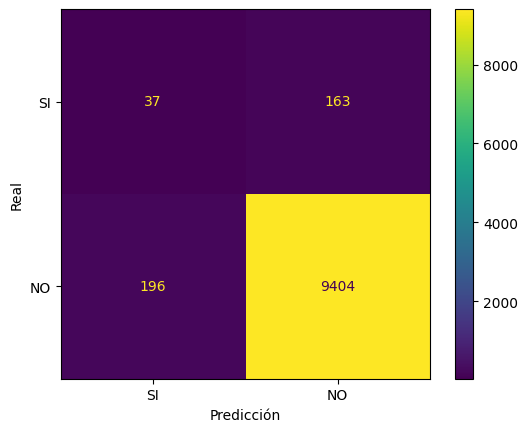

Metrica del negocio: $ 250.0
                 features  importance
2            review_taste    0.228776
1           review_palate    0.198144
0          review_overall    0.182657
5  relacion_overall_aroma    0.152711
4            review_total    0.148690
3                beer_abv    0.089022


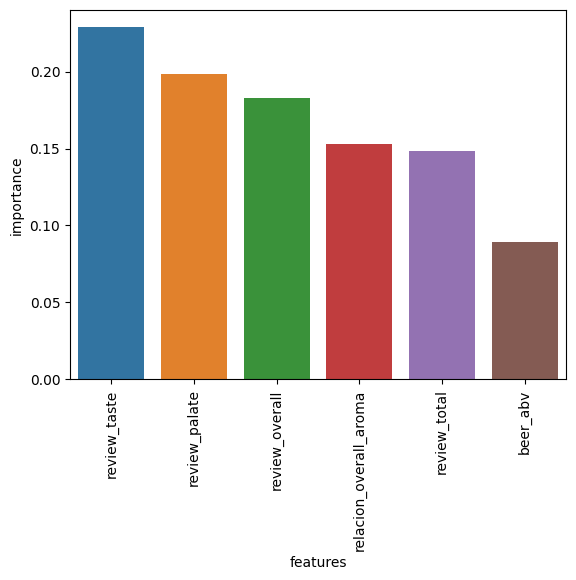

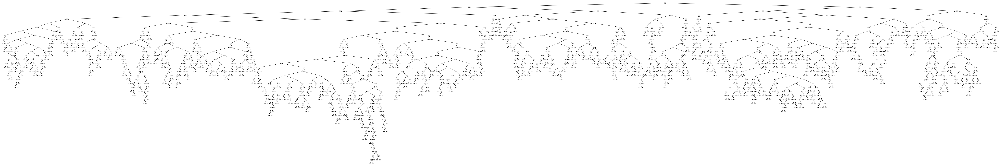

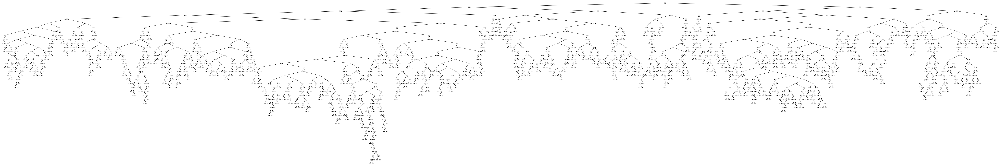

In [33]:
# Las columnas que deseamos mantener
columnas = [
    "review_overall",
    #"review_aroma",
    #"review_appearance",
    "review_palate",
    "review_taste",
    "beer_abv",
    #"potencia_alcoholica",
    #"potencia_alcoholica_muy_baja",
    #"potencia_alcoholica_baja",
    #"potencia_alcoholica_media",
    #"potencia_alcoholica_fuerte",
    #"potencia_alcoholica_muy_fuerte",
    #"review_promedio",
    "review_total",
    'relacion_overall_aroma',
    #'relacion_overall_appearance',
    #'relacion_overall_palate',
    #'relacion_overall_taste',
]

#Adaptamos los datasets de training y testing para contener solo las columnas deseadas
df_x_training_validacion_tmp = df_x_training_validacion_fe[columnas]
df_x_testing_tmp = df_x_testing_fe[columnas]


#Definimos el espacio de busqueda de hiper-parametros
space  = [
    Real(0.10, 0.12, name='umbral_corte'),
    Integer(1, 100, name = 'max_depth'),
    Integer(2, 10000, name = 'min_samples_split'), 
    Integer(1, 10000, name = 'min_samples_leaf')
]


#LA función de minimización
res = gp_minimize(cv_con_umbral_de_corte,                  # the function to minimize
                  space,     # the bounds on each dimension of x
                  n_initial_points = 10,
                  n_calls=100,         # the number of evaluations of f including at x0
                  n_random_starts=10,  # the number of random initialization points
                  random_state= random_state,
                  acq_func = "LCB",
                  callback = lambda res: print([
                          len(res.func_vals), 
                          res.x_iters[len(res.x_iters)-1], 
                          -res.func_vals[len(res.func_vals)-1]
                      ])
                 )
#imprimimos los mejores hiperparametros y la funcion de ganancia
print([res.x, -res.fun])

#Establecemos los mejores paámetros
punto_de_corte = res.x[0]
max_depth = res.x[1]
min_samples_split = res.x[2]
min_samples_leaf = res.x[3]

#Generamos y entrenamos el modelo con los datos de training
clf = DecisionTreeClassifier(
            criterion = criterion,
            max_depth = max_depth,
            min_samples_split = min_samples_split,
            min_samples_leaf = min_samples_leaf,
            random_state = random_state
        )
_ = clf.fit(df_x_training_validacion_tmp, df_y_training_validacion)

#Realizamos la predicción con los datos de testing
y_validacion_pred = clf.predict_proba(df_x_testing_tmp)
df_y_validacion_pred_proba = pd.DataFrame(y_validacion_pred, columns = ['NO_prob', 'SI_prob'])
df_y_validacion_pred_proba['prediccion'] = 'NO'
df_y_validacion_pred_proba.loc[df_y_validacion_pred_proba['SI_prob']>punto_de_corte, 'prediccion'] = 'SI'

#mostramos la matriz de confusión
cm = confusion_matrix(df_y_testing, df_y_validacion_pred_proba['prediccion'], labels=['SI', 'NO'])
true_positives = cm[0,0]
true_negatives = cm[1,1]
false_positives = cm[1, 0]
false_negatives = cm[0,1]
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['SI', 'NO'])
disp.plot()
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.show()

#calculamos y mostramos la metrica del negocio
metrica_negocio = ((4000*true_positives) - (500*false_positives))/(true_positives + false_negatives)
print("Metrica del negocio: $", metrica_negocio)

#importancia de las variables
d = {'features': columnas, 'importance': clf.feature_importances_}
df = pd.DataFrame(data= d).sort_values(by=['importance'],ascending=False)
print(df)

g = sns.barplot(data=df, x="features", y="importance")
plt.setp(g.get_xticklabels(), rotation=90)
plt.show()

fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_8_original.png',format='png',bbox_inches = "tight", dpi=240)
prune_tree(clf.tree_, punto_de_corte)
fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_8_prunned.png',format='png',bbox_inches = "tight", dpi=240)

### Eliminamos review_taste... para probar

[1, [0.1042759991723782, 52, 8809, 8711], 0.0]
[2, [0.10588974211893269, 52, 9007, 6140], 0.0]
[3, [0.10964169070397224, 44, 6029, 2733], 0.0]
[4, [0.11253308201099622, 30, 7223, 7869], 0.0]
[5, [0.10281642852188151, 18, 1670, 8412], 0.0]
[6, [0.11702949212719985, 29, 2736, 8162], 0.0]
[7, [0.1111014412174576, 47, 7507, 980], 0.0]
[8, [0.11592427559085738, 25, 1885, 6687], 0.0]
[9, [0.11697038348605615, 8, 9104, 1900], 0.0]
[10, [0.11395457979170637, 26, 356, 375], 311.48]
[11, [0.12, 100, 2, 10000], 0.0]
[12, [0.1, 100, 2, 1], 227.7]
[13, [0.1, 1, 2, 1], 0.0]
[14, [0.11359398942297588, 65, 2, 1], 227.7]
[15, [0.11835619270292566, 20, 2, 1], 193.08]
[16, [0.11118168163372077, 23, 2, 1], 157.13]
[17, [0.11404598675492504, 100, 2, 1], 227.7]
[18, [0.11789118755346067, 70, 534, 1], 265.59]
[19, [0.12, 1, 582, 1], 0.0]
[20, [0.12, 44, 2, 1], 227.7]
[21, [0.11800867515827407, 87, 2636, 1], 69.92]
[22, [0.1036245705350764, 39, 1458, 1], 67.92]
[23, [0.11991819238488984, 39, 480, 2596], 0.0]


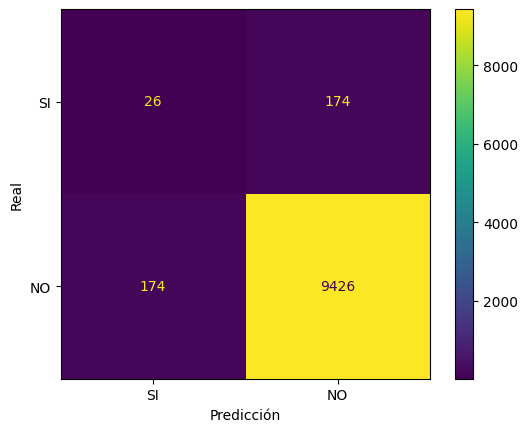

Metrica del negocio: $ 85.0
                 features  importance
0          review_overall    0.580902
3            review_total    0.148695
4  relacion_overall_aroma    0.124051
1           review_palate    0.121691
2                beer_abv    0.024661


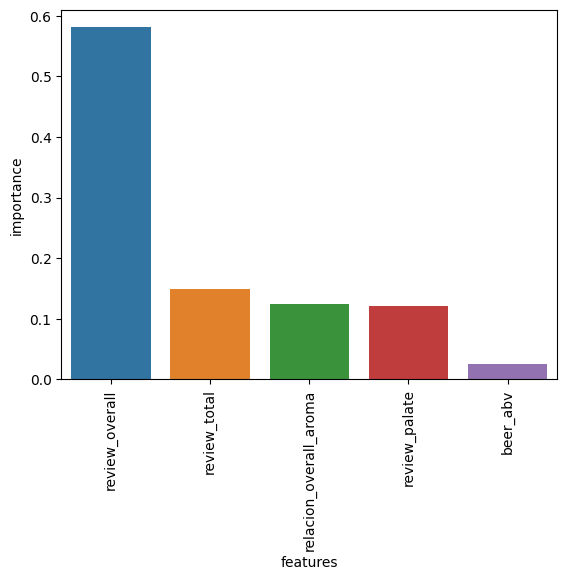

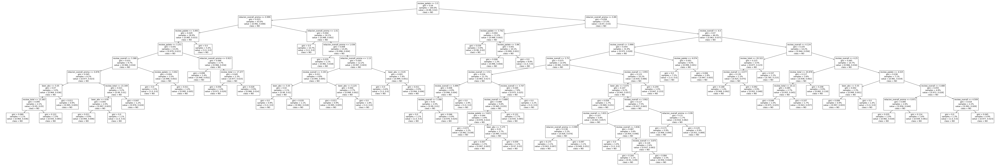

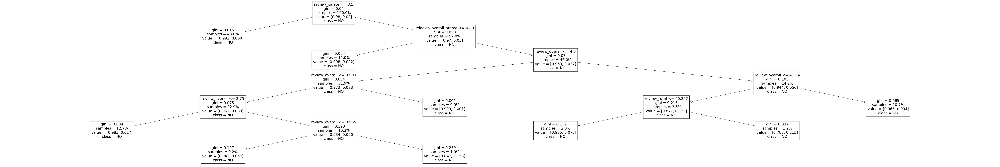

In [34]:
# Las columnas que deseamos mantener
columnas = [
    "review_overall",
    #"review_aroma",
    #"review_appearance",
    "review_palate",
    #"review_taste",
    "beer_abv",
    #"potencia_alcoholica",
    #"potencia_alcoholica_muy_baja",
    #"potencia_alcoholica_baja",
    #"potencia_alcoholica_media",
    #"potencia_alcoholica_fuerte",
    #"potencia_alcoholica_muy_fuerte",
    #"review_promedio",
    "review_total",
    'relacion_overall_aroma',
    #'relacion_overall_appearance',
    #'relacion_overall_palate',
    #'relacion_overall_taste',
]

#Adaptamos los datasets de training y testing para contener solo las columnas deseadas
df_x_training_validacion_tmp = df_x_training_validacion_fe[columnas]
df_x_testing_tmp = df_x_testing_fe[columnas]


#Definimos el espacio de busqueda de hiper-parametros
space  = [
    Real(0.10, 0.12, name='umbral_corte'),
    Integer(1, 100, name = 'max_depth'),
    Integer(2, 10000, name = 'min_samples_split'), 
    Integer(1, 10000, name = 'min_samples_leaf')
]


#LA función de minimización
res = gp_minimize(cv_con_umbral_de_corte,                  # the function to minimize
                  space,     # the bounds on each dimension of x
                  n_initial_points = 10,
                  n_calls=100,         # the number of evaluations of f including at x0
                  n_random_starts=10,  # the number of random initialization points
                  random_state= random_state,
                  acq_func = "LCB",
                  callback = lambda res: print([
                          len(res.func_vals), 
                          res.x_iters[len(res.x_iters)-1], 
                          -res.func_vals[len(res.func_vals)-1]
                      ])
                 )
#imprimimos los mejores hiperparametros y la funcion de ganancia
print([res.x, -res.fun])

#Establecemos los mejores paámetros
punto_de_corte = res.x[0]
max_depth = res.x[1]
min_samples_split = res.x[2]
min_samples_leaf = res.x[3]

#Generamos y entrenamos el modelo con los datos de training
clf = DecisionTreeClassifier(
            criterion = criterion,
            max_depth = max_depth,
            min_samples_split = min_samples_split,
            min_samples_leaf = min_samples_leaf,
            random_state = random_state
        )
_ = clf.fit(df_x_training_validacion_tmp, df_y_training_validacion)

#Realizamos la predicción con los datos de testing
y_validacion_pred = clf.predict_proba(df_x_testing_tmp)
df_y_validacion_pred_proba = pd.DataFrame(y_validacion_pred, columns = ['NO_prob', 'SI_prob'])
df_y_validacion_pred_proba['prediccion'] = 'NO'
df_y_validacion_pred_proba.loc[df_y_validacion_pred_proba['SI_prob']>punto_de_corte, 'prediccion'] = 'SI'

#mostramos la matriz de confusión
cm = confusion_matrix(df_y_testing, df_y_validacion_pred_proba['prediccion'], labels=['SI', 'NO'])
true_positives = cm[0,0]
true_negatives = cm[1,1]
false_positives = cm[1, 0]
false_negatives = cm[0,1]
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['SI', 'NO'])
disp.plot()
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.show()

#calculamos y mostramos la metrica del negocio
metrica_negocio = ((4000*true_positives) - (500*false_positives))/(true_positives + false_negatives)
print("Metrica del negocio: $", metrica_negocio)

#importancia de las variables
d = {'features': columnas, 'importance': clf.feature_importances_}
df = pd.DataFrame(data= d).sort_values(by=['importance'],ascending=False)
print(df)

g = sns.barplot(data=df, x="features", y="importance")
plt.setp(g.get_xticklabels(), rotation=90)
plt.show()

fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_9_original.png',format='png',bbox_inches = "tight", dpi=240)
prune_tree(clf.tree_, punto_de_corte)
fig = plt.figure(figsize=(120,20))
tree.plot_tree(clf, 
                   feature_names=columnas,  
                   class_names=df_y_training_validacion['POPULAR'].unique(),
                   proportion = True,
                   filled=False)
plt.savefig('../Clase 4/img/tree_9_prunned.png',format='png',bbox_inches = "tight", dpi=240)